# Generative Adversarial Network (GAN) for Blastocyst Image Synthesis

This notebook demonstrates the implementation and training of a Conditional Generative Adversarial Network (cGAN) to synthesize images of blastocysts.

**Task:** The primary goal is to train a GAN that can generate realistic images of blastocysts based on specific morphological grade inputs (Expansion, ICM, and TE grades).

**Basic Concepts:**

*   **Generative Adversarial Networks (GANs):** A framework consisting of two neural networks: a **Generator** and a **Discriminator**.
    *   **Generator:** Learns to create new data instances (in this case, blastocyst images) that resemble the training data.
    *   **Discriminator:** Learns to distinguish between real data (from the dataset) and fake data (generated by the Generator).
    *   These two networks are trained in an adversarial manner: the Generator tries to produce data that can fool the Discriminator, while the Discriminator tries to correctly identify real and fake data. This competition drives both networks to improve.
*   **Conditional GANs (cGANs):** An extension of GANs where both the Generator and Discriminator are conditioned on some extra information. In this notebook, the extra information is the blastocyst grade (Expansion, ICM, and TE grades). This allows the Generator to produce images with specific desired characteristics based on the provided grade, and the Discriminator to evaluate the generated images in the context of these conditions.
*   **Blastocyst Grading:** Blastocysts, which are early-stage embryos, are often graded based on their morphological characteristics:
    *   **Expansion (EXP):** The degree to which the blastocyst has expanded.
    *   **Inner Cell Mass (ICM):** The group of cells within the blastocyst that will develop into the fetus.
    *   **Trophectoderm (TE):** The outer layer of cells that will form the placenta.
    Providing these grades as input to the cGAN allows for the generation of blastocyst images corresponding to specific developmental stages and qualities.
*   **Hinge Loss:** A type of loss function often used in GAN training, particularly in StyleGAN, to encourage the discriminator to output larger margins between real and fake samples, which can improve training stability and image quality.
*   **Mode Seeking Regularization:** A technique used to encourage the generator to produce a wider variety of samples that cover all the modes of the real data distribution, preventing mode collapse (where the generator only produces a limited subset of possible outputs).
*   **Spectral Normalization (SN):** A technique applied to the weights of the Discriminator's layers to stabilize training and improve performance.
*   **Pixel Normalization:** A normalization technique used in the Generator to prevent the feature maps from growing or shrinking excessively, contributing to training stability.
*   **Self-Attention:** A mechanism that allows the network to weigh the importance of different parts of the input when processing it, helping to capture long-range dependencies in the image.
*   **Residual Blocks:** Architectural building blocks used in both the Generator and Discriminator to improve the flow of information and enable the training of deeper networks.

This notebook uses PyTorch for implementing and training the cGAN.

## Imports & Initialization

### Install Necessary Packages

In [ ]:
# For augmentation
!pip -q install kornia

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.4 MB/s eta 0:00:00


### Import Necessary Libraries

In [ ]:
import os
import math
import pandas as pd
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
import matplotlib.pyplot as plt

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Folder containing the training/silver and testing/silver images
IMG_FOLDER    = "/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/Images"
# CSV File annotating the training/silver images
CSV_FILE      = "/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/Gardner_train_silver.csv"
# CSV File annotating testing/gold images
CSV_FILE_GOLD = "/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/Gardner_test_gold_onlyGardnerScores.csv"
# Folder where the samples, during training, are saved
SMPL_FOLDER   = "/content/samples"; os.makedirs(SMPL_FOLDER, exist_ok=True)


Using device: cuda


## Blastocyst Dataset

### Custom Dataset Class
A custom dataset class named BlastocystDataset which inherits from the Dataset class provided by PyTorch.

 Loads and preprocesses image data along with their corresponding labels from a CSV file for a blastocyst dataset.

In [ ]:
class BlastocystDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, dataset_type = "silver"):
        # Read the csv annotation file
        self.df = pd.read_csv(annotations_file, delimiter=";")
        self.img_dir = img_dir
        self.transform = transform
        self.dataset_type = dataset_type

        # Perform transformation on training/silver and testing/gold data.
        if self.dataset_type == "silver":
          # filter out NA if needed, or assign a special index
          self.df = self.df.dropna(subset=['EXP_silver','ICM_silver','TE_silver']).reset_index(drop=True)

          # Calculate joint classes
          self.df["joint_labels"] = self.df["EXP_silver"]*16 + self.df["ICM_silver"]*4 + self.df["TE_silver"]
          # Get frequency for each joint_label
          freqs = self.df['joint_labels'].value_counts()
          # Calculate weights based on the frequency
          self.sample_weights = self.df['joint_labels'].apply(
              lambda x: 1 / freqs[x]).astype(float).values
        else:
          # Filter out NA
          self.df = self.df.dropna(subset=['EXP_gold','ICM_gold','TE_gold']).reset_index(drop=True)
          # Filter out ND
          self.df = self.df.drop(self.df.index[self.df['ICM_gold'] == 'ND']).reset_index(drop=True)
          self.df = self.df.drop(self.df.index[self.df['TE_gold'] == 'ND']).reset_index(drop=True)


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Get metadata on index
        row = self.df.iloc[idx]
        # Read specific image
        img = Image.open(os.path.join(self.img_dir, row['Image'])).convert('RGB')
        # Perform trasformations on the image
        if self.transform:
            img = self.transform(img)
        # Assign labels
        if self.dataset_type == "silver":
          label_exp = int(row['EXP_silver']);  label_icm = int(row['ICM_silver']);  label_te = int(row['TE_silver'])
        else:
          label_exp = int(row['EXP_gold']);    label_icm = int(row['ICM_gold']);    label_te = int(row['TE_gold'])
        return img, label_exp, label_icm, label_te

### Data Loading & Preprocessing

Prepare the image data for training the GAN model. dDfine image transformations, set up custom datasets, and create data loaders for efficient batch processing.

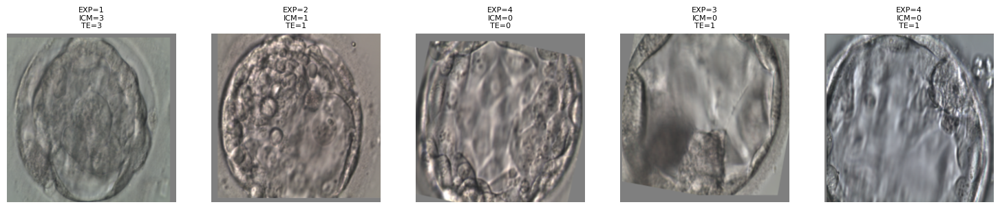

In [ ]:
# The necessary transformations
base_transform = transforms.Compose([
    transforms.Resize((256,256)),           # ensures all images have the same dimensions before being fed into the model
    transforms.ToTensor(),                  # to a PyTorch tensor. It also scales the pixel values from the range of 0-255 to 0.0-1.0
    transforms.Normalize([0.5]*3, [0.5]*3)  # shifts the pixel values to a range of -1.0 to 1.0
])
# For augmentations
import kornia.augmentation as K

aug_transform = K.AugmentationSequential(
    K.RandomHorizontalFlip(p=0.5),
    K.RandomVerticalFlip(p=0.5),
    K.RandomRotation(degrees=180, p=0.5, resample='bilinear', align_corners=False),
    K.RandomAffine(degrees=0, translate=(0.06,0.06)), # shifting the image horizontally and vertically by up to 6%
    data_keys=["input"]                               # the augmentations should be applied to the input image
).to(device)

# for weighted sampling in DataLoader
from torch.utils.data.sampler import WeightedRandomSampler
# The training dataset
dataset = BlastocystDataset(
    CSV_FILE,
    IMG_FOLDER,
    transform=base_transform,
    dataset_type="silver"
)
# DataLoader object for the training Dataset
dataloader = DataLoader(
    dataset,
    batch_size=32,
    sampler=WeightedRandomSampler( # to sample data based on sample_weights
        dataset.sample_weights,
        num_samples=len(dataset),
        replacement=True
    ),
    num_workers=2
)
# The testing dataset
heldout_dataset = BlastocystDataset(
    CSV_FILE_GOLD,
    IMG_FOLDER,
    transform=base_transform,
    dataset_type="gold"
)

import random
import matplotlib.pyplot as plt

# 15x3 figure for plotting
plt.figure(figsize=(15, 3))
for i in range(5):
    # Get a random index
    idx = random.randint(0, len(dataset) - 1)
    # Get the image and its corresponding labels
    img, exp_label, icm_label, te_label = dataset[idx]
    # Add a batch dimension and move to the device
    img_batch = img.unsqueeze(0).to(device)
    # This is just for visualization so don't calculate gradients
    with torch.no_grad():
        # Apply augmentations on the image
        aug_img_batch = aug_transform(img_batch)
    # Remove the batch dimension and move it to cpu
    aug_img = aug_img_batch.squeeze(0).cpu()
    # Denormalize the tensor from [-1, 1] to [0, 1]
    aug_img = aug_img * 0.5 + 0.5
    # Ensure the range of values is within [0, 1]
    aug_img = torch.clamp(aug_img, 0.0, 1.0)
    #  hange the tensor dimensions from (channels, height, width) to (height, width, channels)
    # and convert it to a NumPy array,
    # which is the format expected by matplotlib for displaying images.
    aug_np = aug_img.permute(1, 2, 0).numpy()
    # create a 1x5 grid of subplots and select the (i+1)-th subplot
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(aug_np)
    ax.set_title(f"EXP={exp_label}\nICM={icm_label}\nTE={te_label}", fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()


## GAN Model

### GAN building blocks

 Define several custom modules and functions that serve as fundamental building blocks for the Generative Adversarial Network (GAN) architecture used later in the notebook.

In [ ]:
from typing import Optional, Tuple

class PixelNorm(nn.Module):
    """
    The PixelNorm class implements channel-wise L2 normalization.
    This technique, introduced in StyleGAN,
    normalizes the feature maps in each channel to have unit length along the channel dimension.
    This helps to stabilize the training of the generator
    by preventing the feature maps from growing or shrinking excessively.
    The small value eps is added for numerical stability to avoid division by zero.
    """

    def forward(self, x: torch.Tensor, eps: float = 1e-8) -> torch.Tensor:
        # The mean of the squared values is calculated on the 2nd dimension (dim=1)
        # This dimension corresponds to the channels
        # keepdim=True ensures that the output thensor retains the dimension along which the mean was calculated
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + eps)


class NoiseInjection(nn.Module):
    """
    The NoiseInjection module adds a learnable amount of noise to the feature maps.
    This noise is applied identically across all images in a batch but is scaled by a learned per-channel weight.
    Adding noise at different layers of the generator is another technique used
    to improve the quality and diversity of generated images in StyleGAN.
    """

    def __init__(self, channels: int):
        """
        The constructor for the NoiseInjection module.
        It initializes a learnable parameter called weight.
        This parameter has the shape (1, channels, 1, 1).
        The torch.zeros function initializes this parameter with zeros.
        This weight will be learned during training and controls how much noise is added to each channel of the feature map.
        Input:
          channels: The number of channels in the input feature maps
        """
        super().__init__()
        self.weight = nn.Parameter(torch.zeros(1, channels, 1, 1))

    def forward(self, x: torch.Tensor, noise: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Defines the computation that happens when the NoiseInjection module is called
        Input:
          x: The input tensor of shape (batch_size, channels, height, width)
          noise: The noise tensor of shape (batch_size, 1, height, width) or None
        Output:
        """
        # If noise is None, it generates random noise using torch.randn.
        if noise is None:
            # The noise is generated with the same batch size, height, and width as the input feature map x, but with a single channel (1).
            # This means the same random noise pattern is generated for all channels
            noise = torch.randn(x.size(0), 1, x.size(2), x.size(3), device=x.device, dtype=x.dtype)
        # Noise will be scaled differently per channel by the learned weight.
        return x + self.weight * noise


# a 3×3 blur kernel (StyleGAN2)
# This line initializes a 1D PyTorch tensor with values [1, 2, 1] and a data type of 32-bit floating-point numbers.
_blur_kernel = torch.tensor([1, 2, 1], dtype=torch.float32)
# This line converts the 1D tensor into a 2D tensor (a 3x3 matrix) by performing an outer product
_blur_kernel = (_blur_kernel[:, None] * _blur_kernel[None, :]) / _blur_kernel.sum()


def blur(x: torch.Tensor) -> torch.Tensor:
    """
    A blur function that applies the blur kernel to a given tensor using 2D convolution
    """
    # replicates the kernel along the first dimension (x.size(1) represents the number of channels in the input tensor x).
    # This creates a separate kernel for each channel, allowing the convolution to be applied independently to each channel.
    k = _blur_kernel.to(x.device, x.dtype).repeat(x.size(1), 1, 1, 1)
    return F.conv2d(x, k, padding=1, groups=x.size(1))


class SelfAttn2d(nn.Module):
    """
    The SelfAttn2d class implements non-local self-attention,
    a mechanism from the SAGAN (Self-Attention Generative Adversarial Networks) paper.
    This allows the model to capture dependencies between distant parts of the image,
    improving the generation of images with intricate details and relationships.
    """

    def __init__(self, in_ch: int) -> None:
        """
        The constructor of the class.
        Input:
          in_ch: The number of input channels
        """
        super().__init__()
        #  This defines the "query" convolution layer.
        # It's a 1D convolutional layer that reduces the number of channels by a factor of 8 (in_ch // 8).
        self.q = SN(nn.Conv1d(in_ch, in_ch // 8, 1, bias=False))
        # This defines the "key" convolution layer, similar to the query layer,
        # also reducing the channels by a factor of 8 and using spectral normalization.
        # This defines the "key" convolution layer, similar to the query layer,
        # also reducing the channels by a factor of 8 and using spectral normalization.
        self.k = SN(nn.Conv1d(in_ch, in_ch // 8, 1, bias=False))
        #  This defines the "value" convolution layer.
        # It uses a 1x1 convolution to keep the number of channels the same as the input and also applies spectral normalization.
        self.v = SN(nn.Conv1d(in_ch, in_ch, 1, bias=False))
        # a learnable parameter called gamma, initialized to zero.
        # This parameter will be learned during training
        # and controls the contribution of the self-attention output to the original input.
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # unpacks the dimensions of the input tensor x.
        # b is the batch size, c is the number of channels, h is the height, and w is the width.
        b, c, h, w = x.size()
        # This flattens the spatial dimensions (height and width) of the input tensor,
        # reshaping it into a tensor of shape (batch_size, channels, height * width).
        flat = x.view(b, c, -1)

        # 1. applies the query convolution to the flattened input.
        # 2. rearranges the dimensions of the query output.
        # 3. performs a matrix multiplication between the permuted query output and the key convolution output.
        # This calculates the similarity between each pixel (represented as a vector) and every other pixel.
        attn = self.q(flat).permute(0, 2, 1) @ self.k(flat)
        # - attn / math.sqrt(c / 8) scales the attention scores.
        # - F.softmax(..., dim=-1) normalizes the scores so that they sum to 1 along the last dimension,
        # representing the attention weights.
        attn = F.softmax(attn / math.sqrt(c / 8), dim=-1)
        # - self.v(flat) applies the value convolution to the flattened input.
        # - @ attn.permute(0, 2, 1) performs a matrix multiplication between
        # the value output and the permuted attention weights.
        # This weighs the value vectors based on the calculated attention scores.
        out = self.v(flat) @ attn.permute(0, 2, 1)
        # - out.view(b, c, h, w) reshapes the self-attention output back to the original spatial dimensions.
        # - self.gamma * out.view(b, c, h, w) scales the self-attention output by the learned gamma parameter.
        # - x + ... adds the scaled self-attention output to the original input x.
        # This is a residual connection, which helps in training deeper networks.
        return x + self.gamma * out.view(b, c, h, w)


class GResBlock(nn.Module):
    """
    The GResBlock implements a residual block for the generator.
    It upsamples the input feature map by a factor of 2, applies the blur function,
    followed by two convolutional layers with NoiseInjection and PixelNorm
    """

    def __init__(self, in_ch: int, out_ch: int):
        """
        This is the constructor of the GResBlock
        Input:
          in_ch: The number of input channels
          out_ch: The number of output channels
        """
        super().__init__()
        # Defines a 1x1 convolutional layer for the skip connection
        self.skip = nn.Conv2d(in_ch, out_ch, 1, bias=False)
        # Defines the first 3x3 convolutional layer in the main path
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        # Defines the second 3x3 convolutional layer in the main path
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        # Two instances of the NoiseInjection module
        self.noise1, self.noise2 = NoiseInjection(out_ch), NoiseInjection(out_ch)
        # Two instances of the PixelNorm module
        self.pn1, self.pn2 = PixelNorm(), PixelNorm()
        # The for loop initializes the weights of the convolutional layers
        # and the skip connection using the Kaiming Normal initialization method
        for m in (self.conv1, self.conv2, self.skip):
            nn.init.kaiming_normal_(m.weight, a=0, mode="fan_in", nonlinearity="leaky_relu")

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # 1. F.interpolate(x, scale_factor=2, mode="nearest"): This upsamples the input tensor x by a factor of 2 using nearest-neighbor interpolation.
        # 2. blur(): The upsampled tensor is then passed through the blur function.
        y = blur(F.interpolate(x, scale_factor=2, mode="nearest"))
        # This line processes the y tensor through the first part of the main path of the residual block
        y = F.leaky_relu(self.pn1(self.noise1(self.conv1(y))), 0.2, inplace=True)
        # This line processes the y tensor through the second part of the main path
        y = F.leaky_relu(self.pn2(self.noise2(self.conv2(y))), 0.2, inplace=True)
        # This line handles the skip connection
        skip = self.skip(F.interpolate(x, scale_factor=2, mode="nearest"))
        # This line combines the output of the main path (y) with the skip connection
        return (y + skip) * (1 / math.sqrt(2))


class DResBlock(nn.Module):
    """
    The DResBlock implements a residual block for the discriminator.
    It applies two spectral normalized convolutional layers followed
    by an average pooling layer to downsample the feature maps by a factor of 2.
    Similar to the generator's residual block,
    it includes a skip connection with average pooling and a 1x1 spectral normalized convolution.
    """
    def __init__(self, in_ch: int, out_ch: int):
        """
        The constructor of the class
        Input:
          in_ch: The number of input channels
          out_ch: The number of output channels
        """
        super().__init__()
        # This defines the main path of the residual block.
        # It consists of two 2D convolutional layers (nn.Conv2d)
        self.conv1, self.conv2 = SN(nn.Conv2d(in_ch, out_ch, 3, padding=1)), SN(nn.Conv2d(out_ch, out_ch, 3, padding=1))
        #  This defines the skip connection.
        # It's a single 1x1 convolutional layer that takes the original in_ch input channels
        # and transforms them to out_ch channels
        self.skip = SN(nn.Conv2d(in_ch, out_ch, 1, bias=False))
        # It's used to downsample the feature maps by a factor of 2.
        self.avg_pool = nn.AvgPool2d(2)
        # This loop initializes the weights of the convolutional layers
        # and the skip connection using the Kaiming Normal initialization method
        for m in (self.conv1, self.conv2, self.skip):
            nn.init.kaiming_normal_(m.weight, a=0, mode="fan_in", nonlinearity="leaky_relu")

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # The input x is passed through the first convolutional layer (self.conv1).
        # The output is then passed through a Leaky ReLU
        y = F.leaky_relu(self.conv1(x), 0.2, inplace=True)
        # # The output of the first Leaky ReLU is passed through the second convolutional layer (self.conv2)
        # and another Leaky ReLU activation.
        y = F.leaky_relu(self.conv2(y), 0.2, inplace=True)
        # The output of the main convolutional path (y) is then passed through the average pooling layer
        y = self.avg_pool(y)
        # This is where the residual connection is implemented
        return (y + self.avg_pool(self.skip(x))) * (1 / math.sqrt(2))

### GAN Generator

The purpose of the generator is to learn how to create realistic images based on given input parameters. In this specific case, the generator is designed to produce 256x256 images of blastocysts and is conditional, meaning it takes labels (representing different blastocyst grades) as input to control the characteristics of the generated image.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm as SN
from torch.nn.utils import weight_norm


class Generator(nn.Module):
    """256×256 conditional generator with clamped to-RGB dynamic range."""
    def __init__(self,
                 z_dim: int = 128,
                 label_dim: int = 50,
                 base_ch: int = 1024,
                 num_cls: int = 4):
        """
        the Generator class, which inherits from nn.Module.
        The __init__ method sets up the layers and parameters of the generator.
        Input:
          z_dim: The dimension of the latent noise vector, which serves as the random input
          label_dim: The dimension for embedding each type of blastocyst grade
          base_ch: The base number of channels in the generator's layers
          num_cls: The number of different blastocyst grades
        """
        super().__init__()

        # ---------------- label embeddings -----------------
        # The nn.Embedding layers convert the integer grade labels into dense vectors of size label_dim.
        # This allows the model to learn a representation for each grade.
        self.exp_embed = nn.Embedding(num_cls + 1, label_dim)   # EXP 0-4
        self.icm_embed = nn.Embedding(num_cls,     label_dim)   # ICM A-C
        self.te_embed  = nn.Embedding(num_cls,     label_dim)   # TE  A-C
        lbl_tot = 3 * label_dim

        # ---------------- latent → 4×4 ---------------------
        # These layers process the combined latent noise vector and label embeddings
        # self.fc: A fully connected layer that takes the concatenated latent noise (z_dim)
        # and the total label embedding size (lbl_tot)
        # and maps it to a size corresponding to a base_ch number of channels across a 4x4 spatial dimension.
        self.fc      = nn.Linear(z_dim + lbl_tot, base_ch * 4 * 4)
        # self.lbl_fc4: Another fully connected layer that processes only the combined label embedding
        self.lbl_fc4 = nn.Linear(lbl_tot,          base_ch * 4 * 4)

        # ---------------- upsample backbone ----------------
        self.b8   = GResBlock(base_ch,       base_ch // 2)   # 4→8
        self.b16  = GResBlock(base_ch // 2,  base_ch // 4)   # 8→16
        self.b32  = GResBlock(base_ch // 4,  base_ch // 8)   # 16→32
        self.att32 = SelfAttn2d(base_ch // 8)
        self.b64  = GResBlock(base_ch // 8,  base_ch // 16)  # 32→64
        self.b128 = GResBlock(base_ch // 16, base_ch // 32)  # 64→128
        self.b256 = GResBlock(base_ch // 32, base_ch // 64)  # 128→256

        # ---------------- clamped to-RGB -------------------
        # weight-norm separates direction (v) & magnitude (g)
        self.to_rgb = weight_norm(nn.Conv2d(base_ch // 64, 3, 3, padding=1))

        # initialise direction + *small* gain
        nn.init.normal_(self.to_rgb.weight_v, 0.0, 1.0)
        nn.init.normal_(self.to_rgb.weight_g, 0.0, 0.02)

        # The weight initialization and the _clamp_gain function
        # are techniques used in StyleGAN to control the dynamics
        # of the last layer's weights, aiming for better training stability
        # and output quality. The gain (weight_g) is specifically clamped to a small range.
        # clamp g *every* forward pass (pre-hook)
        def _clamp_gain(_, inp):
            self.to_rgb.weight_g.data.clamp_(0.0, 0.05)
        self.to_rgb.register_forward_pre_hook(_clamp_gain)

        nn.init.zeros_(self.to_rgb.bias)

    # -------------------------------------------------------
    def _lbl_vec(self, exp, icm, te):
        return torch.cat([self.exp_embed(exp),
                          self.icm_embed(icm),
                          self.te_embed(te)], dim=1)

    def forward(self, z, exp, icm, te):
        """
        z   : [B, z_dim]
        exp : [B]   expansion grade (0-4, 0 = unexpanded)
        icm : [B]   ICM grade (0=A,1=B,2=C,3=D if present)
        te  : [B]   TE grade  (0=A,1=B,2=C,3=D)
        """
        lbl = self._lbl_vec(exp, icm, te)                         # [B,150]
        x = self.fc(torch.cat([z, lbl], dim=1))                   # [B,1024*4*4]
        x = x.view(-1, 1024, 4, 4)
        x = x + self.lbl_fc4(lbl).view_as(x)
        x = F.leaky_relu(x, 0.2, inplace=True)

        x = self.b8(x)
        x = self.b16(x)
        x = self.b32(x)
        x = self.att32(x)
        x = self.b64(x)
        x = self.b128(x)
        x = self.b256(x)

        rgb = self.to_rgb(x)                      # clamped gain here
        return torch.tanh(rgb)                    # [-1,1] image

### GAN Discriminator

The discriminator's role is to distinguish between real images from the dataset and fake images generated by the generator. In this specific implementation, the discriminator is also conditional, meaning it takes the blastocyst grade labels as input to help it evaluate the generated images based on their expected characteristics for those grades.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, base_ch: int = 1024, num_cls: int = 4):
        super().__init__()
        self.from_rgb = SN(nn.Conv2d(3, base_ch // 64, 3, padding=1))
        self.d128 = DResBlock(base_ch // 64, base_ch // 32)
        self.d64 = DResBlock(base_ch // 32, base_ch // 16)
        self.d32 = DResBlock(base_ch // 16, base_ch // 8)
        self.att32 = SelfAttn2d(base_ch // 8)
        self.d16 = DResBlock(base_ch // 8, base_ch // 4)
        self.d8 = DResBlock(base_ch // 4, base_ch // 2)
        self.d4 = DResBlock(base_ch // 2, base_ch)
        self.last = SN(nn.Conv2d(base_ch, base_ch, 3, padding=1))
        # projection
        self.exp_emb, self.icm_emb, self.te_emb = (
            nn.Embedding(num_cls + 1, base_ch), nn.Embedding(num_cls, base_ch), nn.Embedding(num_cls, base_ch)
        )
        self.lin = SN(nn.Linear(base_ch, 1))

    def forward(self, x, e, i, t):
        h = F.leaky_relu(self.from_rgb(x), 0.2, inplace=True)
        h = self.d128(h); h = self.d64(h); h = self.d32(h); h = self.att32(h)
        h = self.d16(h); h = self.d8(h); h = self.d4(h)
        h = F.leaky_relu(self.last(h), 0.2, inplace=True)
        h = torch.sum(h, dim=[2, 3])
        logits = self.lin(h)
        logits += (h * self.exp_emb(e)).sum(1, keepdim=True)
        logits += (h * self.icm_emb(i)).sum(1, keepdim=True)
        logits += (h * self.te_emb(t)).sum(1, keepdim=True)
        return logits.squeeze(1)

### Loss functions & helper routines
Define the loss functions used for training the Generative Adversarial Network (GAN) and initialize the Generator (G) and Discriminator (D) models, along with their optimizers.

In [ ]:
import torch.nn.functional as F

def d_hinge_loss(real_logits, fake_logits):
    loss_real = torch.mean(F.relu(1.0 - real_logits))
    loss_fake = torch.mean(F.relu(1.0 + fake_logits))
    return loss_real + loss_fake

def g_hinge_loss(fake_logits):
    return -torch.mean(fake_logits)



z_dim = 128
device = "cuda" if torch.cuda.is_available() else "cpu"

G = Generator(z_dim=z_dim).to(device)           # the ResNet-G you built
D = Discriminator().to(device)                       # the 1-logit ResNet-D

G_ema = Generator(z_dim=z_dim).to(device)
G_ema.load_state_dict(G.state_dict())          # start identical
for p in G_ema.parameters():                  # EMA is inference-only
    p.requires_grad_(False)

ema_beta_base = 0.999     # starting decay
ema_beta_max  = 0.9995    # target decay at the very end

opt_G = torch.optim.Adam(G.parameters(), lr=3e-4, betas=(0.0, 0.999))
opt_D = torch.optim.Adam(D.parameters(), lr=1e-4, betas=(0.0, 0.999))


def init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(m.weight, a=0, mode='fan_in', nonlinearity='relu')
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)
        nn.init.zeros_(m.bias)
G.apply(init);  D.apply(init)

/usr/local/lib/python3.11/dist-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Discriminator(
  (from_rgb): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (d128): DResBlock(
    (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (skip): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avg_pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (d64): DResBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (skip): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avg_pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (d32): DResBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (skip): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avg_pool

## Training

### Training Utilities
Helper functions that are essential for managing the training process of the GAN.

Saving generated images, saving and loading the model's state, and defining the steps for training the generator.

In [ ]:
def save_grid(gen, combos, fname):
    gen.eval()
    with torch.no_grad():
        z_vis = torch.randn(len(combos), z_dim, device=device)
        lbl_e = torch.tensor([c[0] for c in combos], device=device)
        lbl_i = torch.tensor([c[1] for c in combos], device=device)
        lbl_t = torch.tensor([c[2] for c in combos], device=device)
        imgs  = (gen(z_vis, lbl_e, lbl_i, lbl_t) + 1) / 2
    gen.train()

    cols = int(len(combos)**0.5) + 1
    rows = (len(combos)+cols-1)//cols
    fig, ax = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
    ax = ax.flatten()
    for k,(img,(e,i,t)) in enumerate(zip(imgs.cpu(), combos)):
        ax[k].imshow(img.permute(1,2,0))
        ax[k].set_title(f"{e}{icm_letter(i)}{te_letter(t)}", fontsize=8)
        ax[k].axis('off')
    for a in ax[len(combos):]: a.axis('off')
    plt.tight_layout(); plt.savefig(fname, dpi=140); plt.close(fig)


def save_state(epoch, G, G_ema, D, g_opt, d_opt, g_sch, d_sch, path):
    torch.save({
        "epoch": epoch,
        "G":     G.state_dict(),
        "G_ema": G_ema.state_dict(),
        "D":     D.state_dict(),
        "g_opt": g_opt.state_dict(),
        "d_opt": d_opt.state_dict(),
        "g_sch": g_sch.state_dict(),
        "d_sch": d_sch.state_dict()
    }, path)
    print(f"Saved checkpoint: {path}")

def load_state(path, G, G_ema, D, g_opt, d_opt, g_sch, d_sch):
    ckpt = torch.load(path, map_location="cpu", weights_only=False)
    #  ↓ allow loading even if head shapes changed
    G.load_state_dict(ckpt["G"], strict=False)
    G_ema.load_state_dict(ckpt["G_ema"], strict=False)
    D.load_state_dict(ckpt["D"], strict=False)
    g_opt.load_state_dict(ckpt["g_opt"])
    d_opt.load_state_dict(ckpt["d_opt"])
    g_sch.load_state_dict(ckpt["g_sch"])
    d_sch.load_state_dict(ckpt["d_sch"])
    start_epoch = ckpt["epoch"] + 1
    print(f"Loaded checkpoint '{path}' (resuming at epoch {start_epoch})")
    return start_epoch

lambda_ms = 1.2      # mode-seeking weight

@torch.enable_grad()                # explicit just for clarity
def generator_step(z1, exp_labels, icm_labels, te_labels):
    """One flexible G step that returns the loss (for logging)."""
    gen1 = G(z1, exp_labels, icm_labels, te_labels)

    #  ── differentiable augmentations
    gen_aug1 = aug_transform(gen1)
    fake_logits = D(gen_aug1, exp_labels, icm_labels, te_labels)

    g_adv = g_hinge_loss(fake_logits)

    # -------- mode-seeking regulariser -----------------------
    z2   = torch.randn_like(z1)
    gen2 = G(z2, exp_labels, icm_labels, te_labels).detach()
    ms_num = (gen1 - gen2).abs().mean()
    ms_den = (z1   - z2  ).abs().mean()
    ms_loss = ms_num / (ms_den + 1e-8)

    return g_adv - lambda_ms * ms_loss

### Training Loop
The main training loop for the Generative Adversarial Network (GAN).

It iterates through a specified number of epochs, training both the Discriminator and Generator models.

In [ ]:
from tqdm import tqdm

# ────────────────────────────────────────────────────────────── helpers
def icm_letter(i): return chr(ord("A") + i)   # 0→A, 1→B, 2→C
def te_letter(t):  return chr(ord("A") + t)

LOAD_PRETRAINED = True      # cannot reuse old AC-GAN weights safely
num_epochs      = 1000
start_epoch     = 0

scheduler_G = torch.optim.lr_scheduler.CosineAnnealingLR(opt_G, T_max=num_epochs)
scheduler_D = torch.optim.lr_scheduler.CosineAnnealingLR(opt_D, T_max=num_epochs)

if LOAD_PRETRAINED:
    ckpt = "/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_775.pth"
    start_epoch = load_state(ckpt, G, G_ema, D, opt_G, opt_D,
                             scheduler_G, scheduler_D)   # strict=False above
    #scheduler_G = torch.optim.lr_scheduler.CosineAnnealingLR(opt_G, T_max=num_epochs, last_epoch=start_epoch-1)
    #scheduler_D = torch.optim.lr_scheduler.CosineAnnealingLR(opt_D, T_max=num_epochs, last_epoch=start_epoch-1)

ema_fake_acc = 0.5          # init once, outside the epoch loop

for epoch in range(start_epoch, num_epochs):
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}")
    seen, real_correct, fake_correct = 0, 0, 0
    step = 0
    for imgs, exp_labels, icm_labels, te_labels in pbar:
        bsz = imgs.size(0)
        imgs       = imgs.to(device)
        exp_labels = exp_labels.to(device)
        icm_labels = icm_labels.to(device)
        te_labels  = te_labels.to(device)

        # ── 1) Train Discriminator ───────────────────────────
        opt_D.zero_grad()

        # Fake batch (no-grad on G)
        with torch.no_grad():
            z_d = torch.randn(bsz, z_dim, device=device)
            gen_imgs_d = G(z_d, exp_labels, icm_labels, te_labels)

        # ---- D step --------------------------------------------------
        real_aug = aug_transform(imgs).requires_grad_(True) # R1 needs grad
        fake_aug = aug_transform(gen_imgs_d)

        real_logits = D(real_aug, exp_labels, icm_labels, te_labels)
        fake_logits = D(fake_aug, exp_labels, icm_labels, te_labels)

        # hinge loss ---------------------------------------------------
        d_loss = d_hinge_loss(real_logits, fake_logits)

        # Lazy-R1: apply every 16 D updates
        r1_every = 16
        if step % r1_every == 0:
          grad_real = torch.autograd.grad(
              outputs=real_logits.sum(), inputs=real_aug,
              create_graph=True, retain_graph=True
          )[0]
          r1 = grad_real.pow(2).view(grad_real.size(0), -1).sum(1).mean()
          r1_gamma = 1.0
          d_loss = d_loss + (r1_gamma/2) * r1 * r1_every           # γ / 2
        d_loss.backward()
        opt_D.step()

        # real/fake accuracy (optional)
        seen    += bsz
        real_correct += (real_logits > 0).float().sum().item()
        real_acc = real_correct / seen

        fake_correct += (fake_logits < 0).float().sum().item()
        fake_acc = fake_correct / seen

        # ── 2) Train Generator ─────────────────
        batch_fake_acc = (fake_logits < 0).float().mean().item()
        ema_fake_acc   = 0.9 * ema_fake_acc + 0.1 * batch_fake_acc

        g_steps = 1 + int(ema_fake_acc > 0.6) + int(ema_fake_acc > 0.7) + int(ema_fake_acc > 0.8) + int(ema_fake_acc > 0.9) + int(ema_fake_acc > 0.95)   # 1 - 5
        for _ in range(g_steps):
            opt_G.zero_grad()
            g_loss = generator_step(torch.randn(bsz, z_dim, device=device),
                                    exp_labels, icm_labels, te_labels)
            g_loss.backward()
            opt_G.step()
            # ---- EMA update -------------------------------------------
            cur_beta = ema_beta_base + (ema_beta_max - ema_beta_base) * (epoch / num_epochs)
            with torch.no_grad():
                for p_ema, p in zip(G_ema.parameters(), G.parameters()):
                    p_ema.lerp_(p.detach(), 1.0 - cur_beta)   # p_ema = β·p_ema + (1-β)·p

        step += 1
    # ── end-of-epoch housekeeping / visuals / checkpoints ──
    combos = dataset.df[['EXP_silver','ICM_silver','TE_silver']].drop_duplicates().values.tolist()
    save_grid(G     , combos, f"samples/epoch_{epoch+1:03d}_live.png")
    save_grid(G_ema , combos, f"samples/epoch_{epoch+1:03d}_ema.png")

    scheduler_G.step(); scheduler_D.step()

    if (epoch + 1) % 25 == 0:
        save_state(epoch, G, G_ema, D, opt_G, opt_D, scheduler_G, scheduler_D,
                   f"/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_{epoch+1:03d}.pth")
    print(f"Epoch {epoch+1}/{num_epochs} | real_acc={real_acc:.3f} | fake_acc={fake_acc:.3f}"
          f"| D_loss={d_loss.item():.3f} | G_loss={g_loss.item():.3f}")

Loaded checkpoint '/content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_775.pth' (resuming at epoch 775)


Epoch 776: 100%|██████████| 64/64 [02:18<00:00,  2.17s/it]


Epoch 776/1000 | real_acc=0.417 | fake_acc=0.748| D_loss=1.695 | G_loss=0.152


Epoch 777: 100%|██████████| 64/64 [01:09<00:00,  1.09s/it]


Epoch 777/1000 | real_acc=0.408 | fake_acc=0.793| D_loss=1.698 | G_loss=0.368


Epoch 778: 100%|██████████| 64/64 [00:53<00:00,  1.19it/s]


Epoch 778/1000 | real_acc=0.391 | fake_acc=0.777| D_loss=1.515 | G_loss=0.411


Epoch 779: 100%|██████████| 64/64 [00:43<00:00,  1.47it/s]


Epoch 779/1000 | real_acc=0.422 | fake_acc=0.776| D_loss=1.566 | G_loss=0.621


Epoch 780: 100%|██████████| 64/64 [00:45<00:00,  1.40it/s]


Epoch 780/1000 | real_acc=0.405 | fake_acc=0.789| D_loss=1.767 | G_loss=0.380


Epoch 781: 100%|██████████| 64/64 [00:41<00:00,  1.55it/s]


Epoch 781/1000 | real_acc=0.439 | fake_acc=0.739| D_loss=1.971 | G_loss=0.175


Epoch 782: 100%|██████████| 64/64 [00:40<00:00,  1.58it/s]


Epoch 782/1000 | real_acc=0.405 | fake_acc=0.779| D_loss=1.772 | G_loss=0.113


Epoch 783: 100%|██████████| 64/64 [00:42<00:00,  1.49it/s]


Epoch 783/1000 | real_acc=0.388 | fake_acc=0.784| D_loss=1.818 | G_loss=0.194


Epoch 784: 100%|██████████| 64/64 [00:42<00:00,  1.51it/s]


Epoch 784/1000 | real_acc=0.364 | fake_acc=0.791| D_loss=1.728 | G_loss=0.396


Epoch 785: 100%|██████████| 64/64 [00:45<00:00,  1.41it/s]


Epoch 785/1000 | real_acc=0.374 | fake_acc=0.798| D_loss=1.531 | G_loss=0.311


Epoch 786: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 786/1000 | real_acc=0.368 | fake_acc=0.827| D_loss=1.859 | G_loss=0.444


Epoch 787: 100%|██████████| 64/64 [00:47<00:00,  1.34it/s]


Epoch 787/1000 | real_acc=0.367 | fake_acc=0.827| D_loss=1.697 | G_loss=0.224


Epoch 788: 100%|██████████| 64/64 [00:46<00:00,  1.38it/s]


Epoch 788/1000 | real_acc=0.365 | fake_acc=0.819| D_loss=1.645 | G_loss=0.320


Epoch 789: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 789/1000 | real_acc=0.351 | fake_acc=0.830| D_loss=1.644 | G_loss=0.279


Epoch 790: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 790/1000 | real_acc=0.302 | fake_acc=0.864| D_loss=1.779 | G_loss=0.174


Epoch 791: 100%|██████████| 64/64 [00:51<00:00,  1.25it/s]


Epoch 791/1000 | real_acc=0.322 | fake_acc=0.879| D_loss=1.699 | G_loss=0.433


Epoch 792: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 792/1000 | real_acc=0.304 | fake_acc=0.880| D_loss=1.715 | G_loss=0.399


Epoch 793: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 793/1000 | real_acc=0.333 | fake_acc=0.873| D_loss=1.753 | G_loss=0.286


Epoch 794: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 794/1000 | real_acc=0.318 | fake_acc=0.845| D_loss=1.525 | G_loss=0.493


Epoch 795: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 795/1000 | real_acc=0.338 | fake_acc=0.845| D_loss=1.726 | G_loss=0.455


Epoch 796: 100%|██████████| 64/64 [00:54<00:00,  1.18it/s]


Epoch 796/1000 | real_acc=0.313 | fake_acc=0.910| D_loss=1.766 | G_loss=0.428


Epoch 797: 100%|██████████| 64/64 [00:54<00:00,  1.18it/s]


Epoch 797/1000 | real_acc=0.307 | fake_acc=0.894| D_loss=1.762 | G_loss=0.270


Epoch 798: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 798/1000 | real_acc=0.324 | fake_acc=0.855| D_loss=1.664 | G_loss=0.537


Epoch 799: 100%|██████████| 64/64 [00:51<00:00,  1.23it/s]


Epoch 799/1000 | real_acc=0.313 | fake_acc=0.894| D_loss=1.867 | G_loss=0.357


Epoch 800: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_800.pth
Epoch 800/1000 | real_acc=0.329 | fake_acc=0.844| D_loss=1.779 | G_loss=0.350


Epoch 801: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 801/1000 | real_acc=0.321 | fake_acc=0.830| D_loss=1.693 | G_loss=0.236


Epoch 802: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 802/1000 | real_acc=0.341 | fake_acc=0.845| D_loss=1.669 | G_loss=0.246


Epoch 803: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 803/1000 | real_acc=0.342 | fake_acc=0.852| D_loss=1.598 | G_loss=0.413


Epoch 804: 100%|██████████| 64/64 [00:44<00:00,  1.43it/s]


Epoch 804/1000 | real_acc=0.376 | fake_acc=0.793| D_loss=1.561 | G_loss=0.586


Epoch 805: 100%|██████████| 64/64 [00:48<00:00,  1.32it/s]


Epoch 805/1000 | real_acc=0.334 | fake_acc=0.851| D_loss=1.583 | G_loss=0.230


Epoch 806: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 806/1000 | real_acc=0.341 | fake_acc=0.854| D_loss=1.609 | G_loss=0.352


Epoch 807: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 807/1000 | real_acc=0.310 | fake_acc=0.881| D_loss=1.888 | G_loss=0.353


Epoch 808: 100%|██████████| 64/64 [00:51<00:00,  1.23it/s]


Epoch 808/1000 | real_acc=0.315 | fake_acc=0.882| D_loss=1.557 | G_loss=0.448


Epoch 809: 100%|██████████| 64/64 [00:48<00:00,  1.33it/s]


Epoch 809/1000 | real_acc=0.335 | fake_acc=0.841| D_loss=1.760 | G_loss=0.584


Epoch 810: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 810/1000 | real_acc=0.321 | fake_acc=0.838| D_loss=1.741 | G_loss=0.218


Epoch 811: 100%|██████████| 64/64 [00:41<00:00,  1.53it/s]


Epoch 811/1000 | real_acc=0.402 | fake_acc=0.773| D_loss=1.908 | G_loss=0.375


Epoch 812: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 812/1000 | real_acc=0.358 | fake_acc=0.845| D_loss=1.590 | G_loss=0.391


Epoch 813: 100%|██████████| 64/64 [00:44<00:00,  1.43it/s]


Epoch 813/1000 | real_acc=0.395 | fake_acc=0.788| D_loss=1.531 | G_loss=0.333


Epoch 814: 100%|██████████| 64/64 [00:47<00:00,  1.35it/s]


Epoch 814/1000 | real_acc=0.361 | fake_acc=0.843| D_loss=1.709 | G_loss=0.271


Epoch 815: 100%|██████████| 64/64 [00:45<00:00,  1.41it/s]


Epoch 815/1000 | real_acc=0.383 | fake_acc=0.796| D_loss=1.558 | G_loss=0.483


Epoch 816: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 816/1000 | real_acc=0.348 | fake_acc=0.840| D_loss=1.791 | G_loss=0.325


Epoch 817: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 817/1000 | real_acc=0.333 | fake_acc=0.841| D_loss=1.676 | G_loss=0.630


Epoch 818: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 818/1000 | real_acc=0.351 | fake_acc=0.834| D_loss=1.743 | G_loss=0.424


Epoch 819: 100%|██████████| 64/64 [00:43<00:00,  1.49it/s]


Epoch 819/1000 | real_acc=0.389 | fake_acc=0.775| D_loss=1.916 | G_loss=0.189


Epoch 820: 100%|██████████| 64/64 [00:43<00:00,  1.46it/s]


Epoch 820/1000 | real_acc=0.399 | fake_acc=0.798| D_loss=1.583 | G_loss=0.390


Epoch 821: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 821/1000 | real_acc=0.338 | fake_acc=0.872| D_loss=1.632 | G_loss=0.375


Epoch 822: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 822/1000 | real_acc=0.347 | fake_acc=0.855| D_loss=1.636 | G_loss=0.281


Epoch 823: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 823/1000 | real_acc=0.344 | fake_acc=0.861| D_loss=1.737 | G_loss=0.271


Epoch 824: 100%|██████████| 64/64 [00:48<00:00,  1.33it/s]


Epoch 824/1000 | real_acc=0.382 | fake_acc=0.812| D_loss=1.464 | G_loss=0.550


Epoch 825: 100%|██████████| 64/64 [00:45<00:00,  1.41it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_825.pth
Epoch 825/1000 | real_acc=0.409 | fake_acc=0.808| D_loss=1.811 | G_loss=0.289


Epoch 826: 100%|██████████| 64/64 [00:45<00:00,  1.40it/s]


Epoch 826/1000 | real_acc=0.371 | fake_acc=0.803| D_loss=1.866 | G_loss=0.199


Epoch 827: 100%|██████████| 64/64 [00:49<00:00,  1.31it/s]


Epoch 827/1000 | real_acc=0.342 | fake_acc=0.866| D_loss=1.474 | G_loss=0.500


Epoch 828: 100%|██████████| 64/64 [00:45<00:00,  1.42it/s]


Epoch 828/1000 | real_acc=0.379 | fake_acc=0.797| D_loss=1.528 | G_loss=0.339


Epoch 829: 100%|██████████| 64/64 [00:46<00:00,  1.39it/s]


Epoch 829/1000 | real_acc=0.358 | fake_acc=0.813| D_loss=1.809 | G_loss=0.471


Epoch 830: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 830/1000 | real_acc=0.339 | fake_acc=0.847| D_loss=1.339 | G_loss=0.518


Epoch 831: 100%|██████████| 64/64 [00:48<00:00,  1.33it/s]


Epoch 831/1000 | real_acc=0.352 | fake_acc=0.810| D_loss=1.831 | G_loss=0.286


Epoch 832: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 832/1000 | real_acc=0.367 | fake_acc=0.828| D_loss=1.505 | G_loss=0.548


Epoch 833: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 833/1000 | real_acc=0.347 | fake_acc=0.827| D_loss=1.763 | G_loss=0.282


Epoch 834: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 834/1000 | real_acc=0.352 | fake_acc=0.854| D_loss=1.489 | G_loss=0.372


Epoch 835: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 835/1000 | real_acc=0.346 | fake_acc=0.837| D_loss=1.664 | G_loss=0.227


Epoch 836: 100%|██████████| 64/64 [00:51<00:00,  1.25it/s]


Epoch 836/1000 | real_acc=0.318 | fake_acc=0.882| D_loss=1.652 | G_loss=0.533


Epoch 837: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 837/1000 | real_acc=0.308 | fake_acc=0.865| D_loss=1.658 | G_loss=0.396


Epoch 838: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 838/1000 | real_acc=0.345 | fake_acc=0.868| D_loss=1.883 | G_loss=0.385


Epoch 839: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 839/1000 | real_acc=0.334 | fake_acc=0.852| D_loss=1.793 | G_loss=0.371


Epoch 840: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 840/1000 | real_acc=0.358 | fake_acc=0.848| D_loss=1.600 | G_loss=0.589


Epoch 841: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 841/1000 | real_acc=0.346 | fake_acc=0.863| D_loss=1.578 | G_loss=0.269


Epoch 842: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 842/1000 | real_acc=0.345 | fake_acc=0.841| D_loss=1.706 | G_loss=0.366


Epoch 843: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 843/1000 | real_acc=0.319 | fake_acc=0.867| D_loss=1.687 | G_loss=0.336


Epoch 844: 100%|██████████| 64/64 [00:52<00:00,  1.23it/s]


Epoch 844/1000 | real_acc=0.308 | fake_acc=0.884| D_loss=2.011 | G_loss=0.357


Epoch 845: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 845/1000 | real_acc=0.341 | fake_acc=0.863| D_loss=1.592 | G_loss=0.287


Epoch 846: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 846/1000 | real_acc=0.342 | fake_acc=0.866| D_loss=1.802 | G_loss=0.265


Epoch 847: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 847/1000 | real_acc=0.318 | fake_acc=0.831| D_loss=1.693 | G_loss=0.483


Epoch 848: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 848/1000 | real_acc=0.314 | fake_acc=0.837| D_loss=1.711 | G_loss=0.289


Epoch 849: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 849/1000 | real_acc=0.312 | fake_acc=0.877| D_loss=1.706 | G_loss=0.504


Epoch 850: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_850.pth
Epoch 850/1000 | real_acc=0.335 | fake_acc=0.839| D_loss=1.860 | G_loss=0.350


Epoch 851: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 851/1000 | real_acc=0.333 | fake_acc=0.862| D_loss=1.551 | G_loss=0.412


Epoch 852: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 852/1000 | real_acc=0.345 | fake_acc=0.825| D_loss=1.698 | G_loss=0.364


Epoch 853: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 853/1000 | real_acc=0.340 | fake_acc=0.858| D_loss=1.826 | G_loss=0.438


Epoch 854: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 854/1000 | real_acc=0.345 | fake_acc=0.854| D_loss=1.538 | G_loss=0.393


Epoch 855: 100%|██████████| 64/64 [00:46<00:00,  1.39it/s]


Epoch 855/1000 | real_acc=0.351 | fake_acc=0.807| D_loss=1.806 | G_loss=0.473


Epoch 856: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 856/1000 | real_acc=0.354 | fake_acc=0.849| D_loss=1.710 | G_loss=0.174


Epoch 857: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 857/1000 | real_acc=0.342 | fake_acc=0.854| D_loss=1.829 | G_loss=0.456


Epoch 858: 100%|██████████| 64/64 [00:56<00:00,  1.14it/s]


Epoch 858/1000 | real_acc=0.302 | fake_acc=0.901| D_loss=1.988 | G_loss=0.353


Epoch 859: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 859/1000 | real_acc=0.302 | fake_acc=0.887| D_loss=1.891 | G_loss=0.544


Epoch 860: 100%|██████████| 64/64 [00:50<00:00,  1.26it/s]


Epoch 860/1000 | real_acc=0.346 | fake_acc=0.847| D_loss=1.835 | G_loss=0.407


Epoch 861: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 861/1000 | real_acc=0.331 | fake_acc=0.839| D_loss=1.533 | G_loss=0.490


Epoch 862: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 862/1000 | real_acc=0.333 | fake_acc=0.855| D_loss=1.572 | G_loss=0.474


Epoch 863: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 863/1000 | real_acc=0.333 | fake_acc=0.836| D_loss=1.634 | G_loss=0.392


Epoch 864: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 864/1000 | real_acc=0.318 | fake_acc=0.846| D_loss=1.578 | G_loss=0.520


Epoch 865: 100%|██████████| 64/64 [00:50<00:00,  1.26it/s]


Epoch 865/1000 | real_acc=0.300 | fake_acc=0.884| D_loss=1.609 | G_loss=0.488


Epoch 866: 100%|██████████| 64/64 [00:52<00:00,  1.22it/s]


Epoch 866/1000 | real_acc=0.330 | fake_acc=0.898| D_loss=1.614 | G_loss=0.517


Epoch 867: 100%|██████████| 64/64 [00:54<00:00,  1.17it/s]


Epoch 867/1000 | real_acc=0.316 | fake_acc=0.896| D_loss=1.479 | G_loss=0.455


Epoch 868: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 868/1000 | real_acc=0.319 | fake_acc=0.873| D_loss=1.580 | G_loss=0.400


Epoch 869: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 869/1000 | real_acc=0.321 | fake_acc=0.859| D_loss=1.298 | G_loss=0.338


Epoch 870: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 870/1000 | real_acc=0.346 | fake_acc=0.853| D_loss=1.756 | G_loss=0.287


Epoch 871: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 871/1000 | real_acc=0.320 | fake_acc=0.883| D_loss=1.542 | G_loss=0.468


Epoch 872: 100%|██████████| 64/64 [00:54<00:00,  1.18it/s]


Epoch 872/1000 | real_acc=0.316 | fake_acc=0.900| D_loss=1.571 | G_loss=0.385


Epoch 873: 100%|██████████| 64/64 [00:51<00:00,  1.25it/s]


Epoch 873/1000 | real_acc=0.329 | fake_acc=0.888| D_loss=1.707 | G_loss=0.362


Epoch 874: 100%|██████████| 64/64 [00:52<00:00,  1.22it/s]


Epoch 874/1000 | real_acc=0.312 | fake_acc=0.897| D_loss=1.693 | G_loss=0.337


Epoch 875: 100%|██████████| 64/64 [00:57<00:00,  1.11it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_875.pth
Epoch 875/1000 | real_acc=0.327 | fake_acc=0.905| D_loss=1.546 | G_loss=0.340


Epoch 876: 100%|██████████| 64/64 [00:56<00:00,  1.13it/s]


Epoch 876/1000 | real_acc=0.295 | fake_acc=0.906| D_loss=1.557 | G_loss=0.304


Epoch 877: 100%|██████████| 64/64 [00:54<00:00,  1.18it/s]


Epoch 877/1000 | real_acc=0.294 | fake_acc=0.905| D_loss=1.801 | G_loss=0.547


Epoch 878: 100%|██████████| 64/64 [00:55<00:00,  1.16it/s]


Epoch 878/1000 | real_acc=0.296 | fake_acc=0.905| D_loss=1.826 | G_loss=0.487


Epoch 879: 100%|██████████| 64/64 [00:55<00:00,  1.16it/s]


Epoch 879/1000 | real_acc=0.326 | fake_acc=0.888| D_loss=1.766 | G_loss=0.340


Epoch 880: 100%|██████████| 64/64 [00:51<00:00,  1.25it/s]


Epoch 880/1000 | real_acc=0.310 | fake_acc=0.878| D_loss=1.637 | G_loss=0.367


Epoch 881: 100%|██████████| 64/64 [00:51<00:00,  1.24it/s]


Epoch 881/1000 | real_acc=0.303 | fake_acc=0.889| D_loss=1.784 | G_loss=0.479


Epoch 882: 100%|██████████| 64/64 [00:50<00:00,  1.26it/s]


Epoch 882/1000 | real_acc=0.325 | fake_acc=0.869| D_loss=1.608 | G_loss=0.455


Epoch 883: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 883/1000 | real_acc=0.356 | fake_acc=0.857| D_loss=1.934 | G_loss=0.269


Epoch 884: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 884/1000 | real_acc=0.352 | fake_acc=0.821| D_loss=1.956 | G_loss=0.413


Epoch 885: 100%|██████████| 64/64 [00:41<00:00,  1.52it/s]


Epoch 885/1000 | real_acc=0.436 | fake_acc=0.744| D_loss=1.617 | G_loss=0.207


Epoch 886: 100%|██████████| 64/64 [00:41<00:00,  1.55it/s]


Epoch 886/1000 | real_acc=0.397 | fake_acc=0.774| D_loss=1.356 | G_loss=0.554


Epoch 887: 100%|██████████| 64/64 [00:48<00:00,  1.31it/s]


Epoch 887/1000 | real_acc=0.369 | fake_acc=0.839| D_loss=1.777 | G_loss=0.383


Epoch 888: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 888/1000 | real_acc=0.352 | fake_acc=0.824| D_loss=1.723 | G_loss=0.518


Epoch 889: 100%|██████████| 64/64 [00:43<00:00,  1.48it/s]


Epoch 889/1000 | real_acc=0.413 | fake_acc=0.781| D_loss=1.703 | G_loss=0.214


Epoch 890: 100%|██████████| 64/64 [00:41<00:00,  1.55it/s]


Epoch 890/1000 | real_acc=0.415 | fake_acc=0.774| D_loss=1.469 | G_loss=0.398


Epoch 891: 100%|██████████| 64/64 [00:42<00:00,  1.51it/s]


Epoch 891/1000 | real_acc=0.399 | fake_acc=0.792| D_loss=1.671 | G_loss=0.224


Epoch 892: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 892/1000 | real_acc=0.377 | fake_acc=0.828| D_loss=1.740 | G_loss=0.180


Epoch 893: 100%|██████████| 64/64 [00:47<00:00,  1.33it/s]


Epoch 893/1000 | real_acc=0.373 | fake_acc=0.820| D_loss=1.359 | G_loss=0.476


Epoch 894: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 894/1000 | real_acc=0.380 | fake_acc=0.819| D_loss=1.698 | G_loss=0.312


Epoch 895: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 895/1000 | real_acc=0.322 | fake_acc=0.846| D_loss=1.663 | G_loss=0.423


Epoch 896: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 896/1000 | real_acc=0.324 | fake_acc=0.877| D_loss=1.728 | G_loss=0.313


Epoch 897: 100%|██████████| 64/64 [00:54<00:00,  1.18it/s]


Epoch 897/1000 | real_acc=0.319 | fake_acc=0.896| D_loss=2.077 | G_loss=0.344


Epoch 898: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 898/1000 | real_acc=0.322 | fake_acc=0.869| D_loss=1.816 | G_loss=0.399


Epoch 899: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 899/1000 | real_acc=0.337 | fake_acc=0.867| D_loss=1.570 | G_loss=0.356


Epoch 900: 100%|██████████| 64/64 [00:47<00:00,  1.34it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_900.pth
Epoch 900/1000 | real_acc=0.363 | fake_acc=0.827| D_loss=1.719 | G_loss=0.258


Epoch 901: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 901/1000 | real_acc=0.351 | fake_acc=0.848| D_loss=1.628 | G_loss=0.266


Epoch 902: 100%|██████████| 64/64 [00:49<00:00,  1.29it/s]


Epoch 902/1000 | real_acc=0.341 | fake_acc=0.836| D_loss=1.797 | G_loss=0.350


Epoch 903: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 903/1000 | real_acc=0.315 | fake_acc=0.849| D_loss=1.703 | G_loss=0.391


Epoch 904: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 904/1000 | real_acc=0.332 | fake_acc=0.855| D_loss=1.842 | G_loss=0.254


Epoch 905: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 905/1000 | real_acc=0.331 | fake_acc=0.844| D_loss=1.698 | G_loss=0.408


Epoch 906: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 906/1000 | real_acc=0.340 | fake_acc=0.866| D_loss=1.700 | G_loss=0.392


Epoch 907: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 907/1000 | real_acc=0.352 | fake_acc=0.875| D_loss=1.932 | G_loss=0.365


Epoch 908: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 908/1000 | real_acc=0.364 | fake_acc=0.837| D_loss=1.794 | G_loss=0.187


Epoch 909: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 909/1000 | real_acc=0.372 | fake_acc=0.831| D_loss=1.588 | G_loss=0.403


Epoch 910: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 910/1000 | real_acc=0.366 | fake_acc=0.834| D_loss=1.851 | G_loss=0.238


Epoch 911: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 911/1000 | real_acc=0.331 | fake_acc=0.863| D_loss=1.519 | G_loss=0.490


Epoch 912: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 912/1000 | real_acc=0.351 | fake_acc=0.867| D_loss=1.546 | G_loss=0.533


Epoch 913: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 913/1000 | real_acc=0.339 | fake_acc=0.845| D_loss=1.508 | G_loss=0.293


Epoch 914: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 914/1000 | real_acc=0.367 | fake_acc=0.833| D_loss=1.661 | G_loss=0.305


Epoch 915: 100%|██████████| 64/64 [00:48<00:00,  1.32it/s]


Epoch 915/1000 | real_acc=0.349 | fake_acc=0.819| D_loss=1.556 | G_loss=0.384


Epoch 916: 100%|██████████| 64/64 [00:48<00:00,  1.32it/s]


Epoch 916/1000 | real_acc=0.375 | fake_acc=0.818| D_loss=1.607 | G_loss=0.380


Epoch 917: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 917/1000 | real_acc=0.364 | fake_acc=0.832| D_loss=1.800 | G_loss=0.157


Epoch 918: 100%|██████████| 64/64 [00:48<00:00,  1.32it/s]


Epoch 918/1000 | real_acc=0.381 | fake_acc=0.815| D_loss=1.768 | G_loss=0.171


Epoch 919: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 919/1000 | real_acc=0.368 | fake_acc=0.822| D_loss=1.674 | G_loss=0.474


Epoch 920: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 920/1000 | real_acc=0.366 | fake_acc=0.820| D_loss=1.798 | G_loss=0.164


Epoch 921: 100%|██████████| 64/64 [00:49<00:00,  1.30it/s]


Epoch 921/1000 | real_acc=0.345 | fake_acc=0.827| D_loss=1.753 | G_loss=0.402


Epoch 922: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 922/1000 | real_acc=0.334 | fake_acc=0.844| D_loss=1.752 | G_loss=0.511


Epoch 923: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 923/1000 | real_acc=0.346 | fake_acc=0.837| D_loss=1.681 | G_loss=0.395


Epoch 924: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 924/1000 | real_acc=0.334 | fake_acc=0.839| D_loss=1.701 | G_loss=0.354


Epoch 925: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_925.pth
Epoch 925/1000 | real_acc=0.340 | fake_acc=0.837| D_loss=1.774 | G_loss=0.362


Epoch 926: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 926/1000 | real_acc=0.346 | fake_acc=0.831| D_loss=1.877 | G_loss=0.223


Epoch 927: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 927/1000 | real_acc=0.340 | fake_acc=0.838| D_loss=1.849 | G_loss=0.268


Epoch 928: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 928/1000 | real_acc=0.358 | fake_acc=0.829| D_loss=1.865 | G_loss=0.307


Epoch 929: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 929/1000 | real_acc=0.337 | fake_acc=0.859| D_loss=1.718 | G_loss=0.286


Epoch 930: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 930/1000 | real_acc=0.321 | fake_acc=0.861| D_loss=1.913 | G_loss=0.255


Epoch 931: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 931/1000 | real_acc=0.329 | fake_acc=0.860| D_loss=1.548 | G_loss=0.214


Epoch 932: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 932/1000 | real_acc=0.307 | fake_acc=0.853| D_loss=1.873 | G_loss=0.296


Epoch 933: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 933/1000 | real_acc=0.327 | fake_acc=0.842| D_loss=1.863 | G_loss=0.340


Epoch 934: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 934/1000 | real_acc=0.335 | fake_acc=0.847| D_loss=1.834 | G_loss=0.406


Epoch 935: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 935/1000 | real_acc=0.342 | fake_acc=0.846| D_loss=1.741 | G_loss=0.290


Epoch 936: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 936/1000 | real_acc=0.327 | fake_acc=0.858| D_loss=1.522 | G_loss=0.268


Epoch 937: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 937/1000 | real_acc=0.327 | fake_acc=0.846| D_loss=1.895 | G_loss=0.367


Epoch 938: 100%|██████████| 64/64 [00:49<00:00,  1.28it/s]


Epoch 938/1000 | real_acc=0.325 | fake_acc=0.840| D_loss=1.839 | G_loss=0.333


Epoch 939: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 939/1000 | real_acc=0.321 | fake_acc=0.880| D_loss=1.510 | G_loss=0.388


Epoch 940: 100%|██████████| 64/64 [00:52<00:00,  1.23it/s]


Epoch 940/1000 | real_acc=0.303 | fake_acc=0.871| D_loss=1.705 | G_loss=0.331


Epoch 941: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 941/1000 | real_acc=0.307 | fake_acc=0.863| D_loss=1.563 | G_loss=0.315


Epoch 942: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 942/1000 | real_acc=0.299 | fake_acc=0.877| D_loss=1.947 | G_loss=0.353


Epoch 943: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 943/1000 | real_acc=0.311 | fake_acc=0.880| D_loss=1.677 | G_loss=0.347


Epoch 944: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 944/1000 | real_acc=0.321 | fake_acc=0.877| D_loss=1.824 | G_loss=0.370


Epoch 945: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 945/1000 | real_acc=0.300 | fake_acc=0.882| D_loss=1.707 | G_loss=0.535


Epoch 946: 100%|██████████| 64/64 [00:50<00:00,  1.26it/s]


Epoch 946/1000 | real_acc=0.316 | fake_acc=0.886| D_loss=1.615 | G_loss=0.460


Epoch 947: 100%|██████████| 64/64 [00:51<00:00,  1.25it/s]


Epoch 947/1000 | real_acc=0.317 | fake_acc=0.885| D_loss=1.827 | G_loss=0.373


Epoch 948: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 948/1000 | real_acc=0.318 | fake_acc=0.875| D_loss=1.779 | G_loss=0.449


Epoch 949: 100%|██████████| 64/64 [00:56<00:00,  1.12it/s]


Epoch 949/1000 | real_acc=0.317 | fake_acc=0.859| D_loss=1.785 | G_loss=0.140


Epoch 950: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_950.pth
Epoch 950/1000 | real_acc=0.295 | fake_acc=0.872| D_loss=1.837 | G_loss=0.394


Epoch 951: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 951/1000 | real_acc=0.309 | fake_acc=0.864| D_loss=1.664 | G_loss=0.363


Epoch 952: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 952/1000 | real_acc=0.309 | fake_acc=0.879| D_loss=1.822 | G_loss=0.359


Epoch 953: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 953/1000 | real_acc=0.327 | fake_acc=0.833| D_loss=1.596 | G_loss=0.344


Epoch 954: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 954/1000 | real_acc=0.330 | fake_acc=0.856| D_loss=1.659 | G_loss=0.263


Epoch 955: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 955/1000 | real_acc=0.329 | fake_acc=0.858| D_loss=1.568 | G_loss=0.430


Epoch 956: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 956/1000 | real_acc=0.333 | fake_acc=0.839| D_loss=1.767 | G_loss=0.416


Epoch 957: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 957/1000 | real_acc=0.355 | fake_acc=0.858| D_loss=1.652 | G_loss=0.435


Epoch 958: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 958/1000 | real_acc=0.339 | fake_acc=0.867| D_loss=1.451 | G_loss=0.324


Epoch 959: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 959/1000 | real_acc=0.341 | fake_acc=0.859| D_loss=1.570 | G_loss=0.185


Epoch 960: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 960/1000 | real_acc=0.333 | fake_acc=0.864| D_loss=1.725 | G_loss=0.229


Epoch 961: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 961/1000 | real_acc=0.339 | fake_acc=0.848| D_loss=1.647 | G_loss=0.422


Epoch 962: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 962/1000 | real_acc=0.339 | fake_acc=0.848| D_loss=1.712 | G_loss=0.325


Epoch 963: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 963/1000 | real_acc=0.334 | fake_acc=0.865| D_loss=1.814 | G_loss=0.253


Epoch 964: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 964/1000 | real_acc=0.344 | fake_acc=0.863| D_loss=2.007 | G_loss=0.354


Epoch 965: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 965/1000 | real_acc=0.334 | fake_acc=0.852| D_loss=1.669 | G_loss=0.390


Epoch 966: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 966/1000 | real_acc=0.345 | fake_acc=0.849| D_loss=1.664 | G_loss=0.246


Epoch 967: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 967/1000 | real_acc=0.345 | fake_acc=0.858| D_loss=1.737 | G_loss=0.284


Epoch 968: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 968/1000 | real_acc=0.328 | fake_acc=0.861| D_loss=1.700 | G_loss=0.144


Epoch 969: 100%|██████████| 64/64 [00:50<00:00,  1.26it/s]


Epoch 969/1000 | real_acc=0.338 | fake_acc=0.867| D_loss=1.835 | G_loss=0.292


Epoch 970: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 970/1000 | real_acc=0.332 | fake_acc=0.864| D_loss=1.517 | G_loss=0.436


Epoch 971: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 971/1000 | real_acc=0.337 | fake_acc=0.871| D_loss=1.446 | G_loss=0.518


Epoch 972: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 972/1000 | real_acc=0.332 | fake_acc=0.855| D_loss=1.472 | G_loss=0.437


Epoch 973: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 973/1000 | real_acc=0.335 | fake_acc=0.861| D_loss=1.866 | G_loss=0.337


Epoch 974: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 974/1000 | real_acc=0.321 | fake_acc=0.856| D_loss=1.691 | G_loss=0.430


Epoch 975: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_975.pth
Epoch 975/1000 | real_acc=0.316 | fake_acc=0.862| D_loss=1.756 | G_loss=0.378


Epoch 976: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 976/1000 | real_acc=0.326 | fake_acc=0.845| D_loss=1.670 | G_loss=0.410


Epoch 977: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 977/1000 | real_acc=0.313 | fake_acc=0.850| D_loss=1.714 | G_loss=0.337


Epoch 978: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 978/1000 | real_acc=0.327 | fake_acc=0.845| D_loss=1.686 | G_loss=0.242


Epoch 979: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 979/1000 | real_acc=0.310 | fake_acc=0.838| D_loss=1.576 | G_loss=0.410


Epoch 980: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 980/1000 | real_acc=0.339 | fake_acc=0.857| D_loss=1.591 | G_loss=0.461


Epoch 981: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 981/1000 | real_acc=0.340 | fake_acc=0.837| D_loss=1.838 | G_loss=0.311


Epoch 982: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 982/1000 | real_acc=0.348 | fake_acc=0.856| D_loss=1.624 | G_loss=0.500


Epoch 983: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 983/1000 | real_acc=0.333 | fake_acc=0.859| D_loss=1.739 | G_loss=0.359


Epoch 984: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 984/1000 | real_acc=0.313 | fake_acc=0.849| D_loss=1.952 | G_loss=0.316


Epoch 985: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 985/1000 | real_acc=0.348 | fake_acc=0.852| D_loss=1.813 | G_loss=0.278


Epoch 986: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 986/1000 | real_acc=0.336 | fake_acc=0.861| D_loss=1.728 | G_loss=0.285


Epoch 987: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 987/1000 | real_acc=0.340 | fake_acc=0.848| D_loss=1.695 | G_loss=0.381


Epoch 988: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 988/1000 | real_acc=0.334 | fake_acc=0.855| D_loss=1.818 | G_loss=0.458


Epoch 989: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 989/1000 | real_acc=0.352 | fake_acc=0.849| D_loss=1.897 | G_loss=0.408


Epoch 990: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 990/1000 | real_acc=0.344 | fake_acc=0.841| D_loss=1.828 | G_loss=0.253


Epoch 991: 100%|██████████| 64/64 [00:50<00:00,  1.28it/s]


Epoch 991/1000 | real_acc=0.334 | fake_acc=0.856| D_loss=1.586 | G_loss=0.352


Epoch 992: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 992/1000 | real_acc=0.343 | fake_acc=0.852| D_loss=1.756 | G_loss=0.194


Epoch 993: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 993/1000 | real_acc=0.335 | fake_acc=0.869| D_loss=1.574 | G_loss=0.444


Epoch 994: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 994/1000 | real_acc=0.343 | fake_acc=0.857| D_loss=1.758 | G_loss=0.329


Epoch 995: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 995/1000 | real_acc=0.353 | fake_acc=0.852| D_loss=1.846 | G_loss=0.354


Epoch 996: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 996/1000 | real_acc=0.339 | fake_acc=0.842| D_loss=1.537 | G_loss=0.373


Epoch 997: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 997/1000 | real_acc=0.332 | fake_acc=0.846| D_loss=1.630 | G_loss=0.330


Epoch 998: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 998/1000 | real_acc=0.332 | fake_acc=0.850| D_loss=1.583 | G_loss=0.280


Epoch 999: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Epoch 999/1000 | real_acc=0.343 | fake_acc=0.851| D_loss=1.663 | G_loss=0.361


Epoch 1000: 100%|██████████| 64/64 [00:50<00:00,  1.27it/s]


Saved checkpoint: /content/drive/MyDrive/Msc in AI/Deep Learning/Blastocyst_Dataset/cgan_checkpoints/gan_epoch_1000.pth
Epoch 1000/1000 | real_acc=0.334 | fake_acc=0.860| D_loss=1.730 | G_loss=0.259


## Sampling

### Visualize grid
Visualizing the generated images from the trained Generative Adversarial Network (GAN) and comparing them with real images from the dataset.

The goal is to demonstrate the Generator's ability to produce images that resemble the real data for different blastocyst grades.

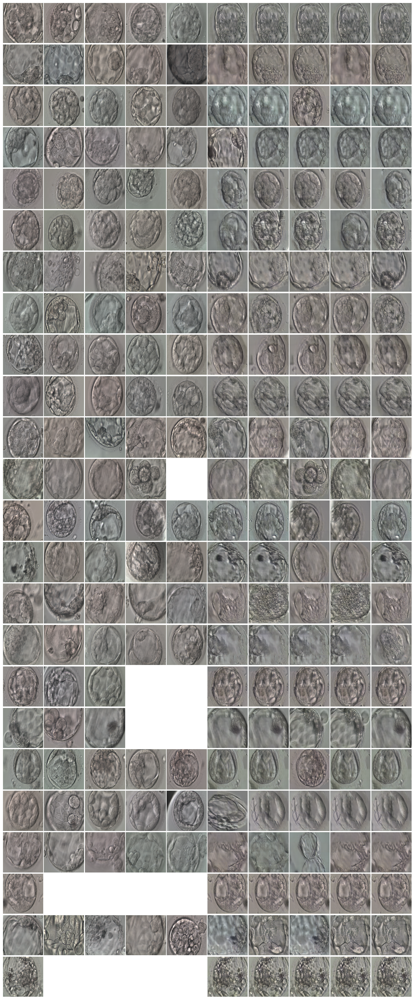

In [ ]:
import random, math, torch, time
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

G.eval(); D.eval()

grades_map = {0: 'A', 1: 'B', 2: 'C', 3: 'ND'}
max_per_side = 5          # how many real / fake images to display

# ── 1. unique grade triplets in the dataset ─────────────────────────────
combos = dataset.df[['EXP_silver', 'ICM_silver', 'TE_silver']]\
            .drop_duplicates().values.tolist()

# ── 2. gather images ────────────────────────────────────────────────────
rows, cols = len(combos), max_per_side * 2         # 10 columns total
fig, axes  = plt.subplots(rows, cols,
                          figsize=(cols * 1.4, rows * 1.4),
                          squeeze=False)

for r, (exp_c, icm_c, te_c) in enumerate(combos):
    # --- find up-to-5 real indices for this combo ----------------------
    idx_pool = dataset.df.index[
        (dataset.df['EXP_silver'] == exp_c) &
        (dataset.df['ICM_silver'] == icm_c) &
        (dataset.df['TE_silver']  == te_c)
    ].tolist()
    random.shuffle(idx_pool)
    real_idxs = idx_pool[:max_per_side]

    # --- loop over 5 slots on each side --------------------------------
    for k in range(max_per_side):
        #time.sleep(1)
        # -------- REAL -----------------------------------------------
        if k < len(real_idxs):                # image exists
            real_img, *_ = dataset[real_idxs[k]]
            real_img = (real_img + 1) / 2     # un-norm to [0,1]
            axes[r, k].imshow(to_pil_image(real_img))
        axes[r, k].axis('off')

        # -------- FAKE ----------------------------------------------
        z = torch.randn(1, z_dim, device=device)
        with torch.no_grad():
            fake_img = G(
                z,
                torch.tensor([exp_c], device=device),
                torch.tensor([icm_c], device=device),
                torch.tensor([te_c],  device=device)
            ).cpu().squeeze(0)
        fake_img = (fake_img + 1) / 2
        axes[r, k + max_per_side].imshow(to_pil_image(fake_img))
        axes[r, k + max_per_side].axis('off')

    # --- add grade label in the middle of the row ----------------------
    grade_str = f"{exp_c+1}{grades_map[icm_c]}{grades_map[te_c]}"
    axes[r, 0].set_ylabel(grade_str, rotation=0, labelpad=30,
                          va='center', fontsize=10, weight='bold')

# ── tidy up ─────────────────────────────────────────────────────────────
plt.tight_layout(w_pad=0.2, h_pad=0.2)
plt.show()


In [ ]:
!zip -r /content/samples.zip /content/samples

from google.colab import files
files.download("/content/samples.zip")

  adding: content/samples/ (stored 0%)
  adding: content/samples/epoch_886_ema.png (deflated 0%)
  adding: content/samples/epoch_857_live.png (deflated 0%)
  adding: content/samples/epoch_827_ema.png (deflated 0%)
  adding: content/samples/epoch_965_ema.png (deflated 1%)
  adding: content/samples/epoch_784_ema.png (deflated 0%)
  adding: content/samples/epoch_982_ema.png (deflated 1%)
  adding: content/samples/epoch_945_live.png (deflated 0%)
  adding: content/samples/epoch_838_live.png (deflated 0%)
  adding: content/samples/epoch_792_ema.png (deflated 0%)
  adding: content/samples/epoch_864_live.png (deflated 0%)
  adding: content/samples/epoch_791_ema.png (deflated 0%)
  adding: content/samples/epoch_943_ema.png (deflated 0%)
  adding: content/samples/epoch_876_ema.png (deflated 0%)
  adding: content/samples/epoch_981_ema.png (deflated 1%)
  adding: content/samples/epoch_882_live.png (deflated 0%)
  adding: content/samples/epoch_919_live.png (deflated 0%)
  adding: content/samples/e

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>